In [13]:
from tqdm import tqdm

import numpy as np

cubes = ['hydro', 'ssd', '300G']

mus = [2, 3, 4, 5, 6, 7, 8, 9, 1]

dpn = np.zeros((3, 9, 512 * 512))

for i, cube in enumerate(cubes):
    
    for j, mu in tqdm(enumerate(mus), desc = cube):
    
        dpn[i, j, :] = np.loadtxt(cube + '/dpn.log.' + str(mu))

dpn = dpn.reshape(3, 9, 512, 512)

np.savez('dpn', dpn = dpn)

dpn = np.load('dpn.npz')['dpn']

hydro: 9it [00:10,  1.10s/it]
ssd: 9it [00:09,  1.01it/s]
300G: 9it [00:10,  1.12s/it]


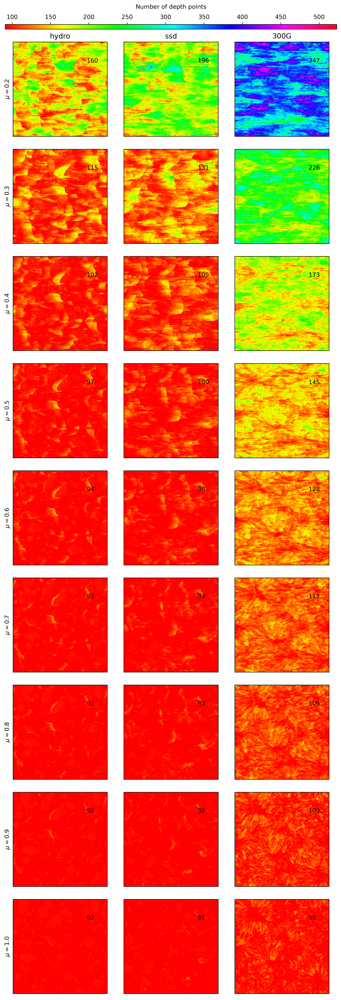

In [15]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

mus = np.arange(2, 11) / 10

plt.close('all')

#fig = plt.figure(figsize = (10, 20))

fig = plt.figure(dpi = 300)

#fig.set_size_inches(8.27, 11.69, forward = True)
#fig.set_size_inches(8.27, 19.48, forward = True)
fig.set_size_inches(10, 30, forward = True)

gs = gridspec.GridSpec(10, 3, height_ratios = [0.05, 1, 1, 1, 1, 1, 1, 1, 1, 1], wspace = 0.01, hspace = 0.15)

cbar = plt.subplot(gs[0, :])

colormap = 'hsv'

dpn_min = np.min(dpn)
dpn_max = np.max(dpn)

for i, cube in enumerate(cubes):
    
    for j, mu in enumerate(mus):
        
        plot = plt.subplot(gs[j + 1, i])
        
        img = plot.imshow(dpn[i, j, :, :], cmap = colormap, vmin = dpn_min, vmax = dpn_max)
        
        if j == 0: plot.set_title(cube)
        if i == 0: plot.set_ylabel(r'$\mu = $' + str(mu))
        
        plot.set_xlim(0, 511)
        plot.set_ylim(0, 511)
        
        plot.xaxis.set_ticklabels([])
        plot.xaxis.set_ticks([])
        
        plot.yaxis.set_ticklabels([])
        plot.yaxis.set_ticks([])
        
        plot.text(400, 400, str(int(np.mean(dpn[i, j, :, :]))))

cb = Colorbar(ax = cbar, mappable = img, orientation = 'horizontal', ticklocation = 'top')

cb.set_label('Number of depth points', labelpad = 10)

plt.savefig('dpn.pdf', bbox_inches = 'tight')

plt.show()